In [79]:
%load_ext autoreload
%autoreload 2

import yfinance as yf
import pandas as pd
from pathlib import Path
from datetime import datetime
import os
import matplotlib.pyplot as plt

import sys
!{sys.executable} -m pip install -e ..

from StockScreener.indicators import ComputeExponentialMovingAvg
from StockScreener.plotting import PlotStockHistory
from StockScreener.screening import FilterNames
from StockScreener.config import *

from StockScreener.BacktestEngine import BacktestEngine
from StockScreener.Portfolio import Portfolio
from StockScreener.Position import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Obtaining file:///Users/Sean/Desktop/StockScanner
  Installing build dependencies ... error
  error: subprocess-exited-with-error
  
  × installing build dependencies did not run successfully.
  │ exit code: 1
  ╰─> [8 lines of output]
      ERROR: Could not find a version that satisfies the requirement setuptools>=61 (from versions: none)
      ERROR: No matching distribution found for setuptools>=61
      
      [end of output]
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
ERROR: Failed to build 'file:///Users/Sean/Desktop/StockScanner' when installing build dependencies


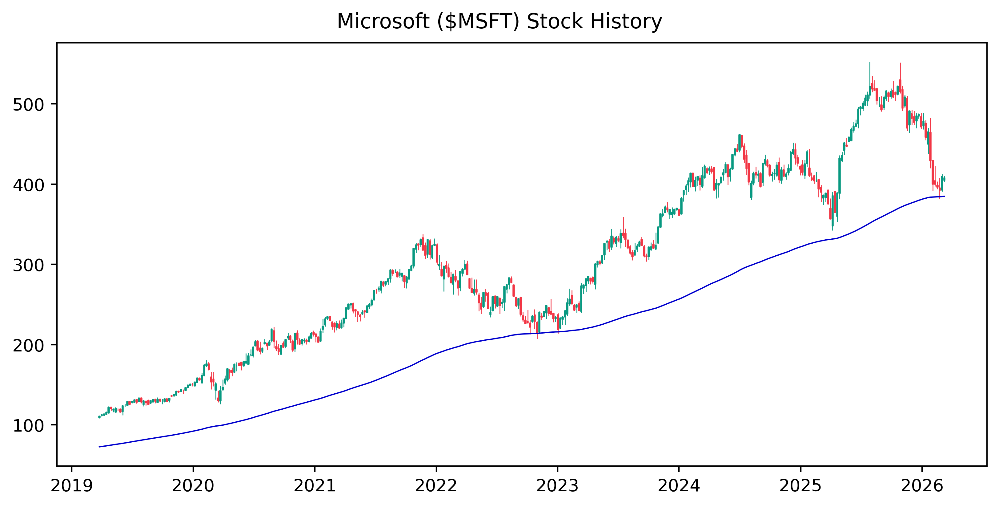

In [3]:
ticker = yf.Ticker("MSFT")
stock_history = ticker.history(period="max", interval="1wk")
stock_history["Avg"] = ComputeExponentialMovingAvg(stock_history)
stock_history["DistOffAvg"] = stock_history["Close"] - stock_history["Avg"]

PlotStockHistory(stock_history, ticker)

In [293]:
nyse = pd.read_csv("./nyse-listed.csv")
nyse_filtered = nyse[nyse["ACT Symbol"].apply(lambda x: not ("$" in x or "." in x))]

names = nyse_filtered["ACT Symbol"].to_list()
# names = nyse_filtered["ACT Symbol"].to_list()[::20]
# names = ["SOFI"]

screened, stocks_trading_data = FilterNames(names)
screened = screened.sort_values("Greater Pullback")
screened.to_csv("./nyse-listed_filtered_market_cap.csv", index=False)

[*********************100%***********************]  2408 of 2408 completed

234 Failed downloads:
['HIX', 'CHT', 'HFMF', 'HFGM', 'PHR', 'GTLS', 'CARS', 'FOR', 'MITT', 'UNF', 'UHT', 'BP', 'STWD', 'BC', 'FIG', 'HWM', 'CCK', 'MCK', 'IONQ', 'BW', 'ASAN', 'NYC', 'TDC', 'CL', 'APD', 'MH', 'ELME', 'RCI', 'COLD', 'KW', 'BGB', 'AGX', 'PXED', 'NOM', 'FLO', 'AIR', 'AN', 'AVD', 'BIRK', 'LUCK', 'BEP', 'SITC', 'CMP', 'AAMI', 'ESAB', 'DCO', 'NVRI', 'YOU', 'USFD', 'LVS', 'STLA', 'CNX', 'CLDT', 'BCS', 'IIF', 'OGN', 'NMT', 'EGP', 'CQP', 'HPQ', 'TRP', 'LDP', 'BCSM', 'JEF', 'GRMN', 'BBDO', 'RWTN', 'SJM', 'GEF', 'CTEV', 'FEDU', 'DBL', 'VTMX', 'EMBJ', 'TALO', 'MFC', 'PACK', 'GDIV', 'ORN', 'DE', 'AER', 'WTTR', 'BXSL', 'ENIC', 'TMHC', 'CMS', 'AXR', 'GLOB', 'DEC', 'ALIT', 'HMY', 'USNA', 'KRMN', 'ANGX', 'EOS', 'LITB', 'SBDS', 'TXO', 'TUYA', 'DIS', 'FTWO', 'NABL', 'MAS', 'BME', 'AD', 'TVC', 'MICC', 'GXO', 'KRO', 'HGTY', 'LYB', 'CWK', 'DQ', 'EARN', 'GBAB', 'COR', 'TNET', 'TTI', 'GGB', 'EVT', 'EMP', 'ASG', 'OUT', 

A has passed
AA has failed price pullback; percentOffMean=np.float64(59.80290008486291), -9.648985159430993, pullback_score=0
AAP has failed revenue growth; -0.012
AAT has failed minMarketCap; 1477755570.516899
AAUC has failed minNumWeeks; 81
AB has failed revenue growth; -0.23010747154534306
ABBV has failed price pullback; percentOffMean=np.float64(32.71884297700225), -4.309465772219019, pullback_score=0
ABCB has failed price pullback; percentOffMean=np.float64(33.80331214076923), -11.729937827981354, pullback_score=0
ABEV has failed price pullback; percentOffMean=np.float64(17.71102981277403), -5.246915919554334, pullback_score=0
ABG has failed trading volume; adtv=None, avg_shares=None
ABM has failed on earnings; ttm_eps=np.float64(3.25), slope=np.float64(-0.006666666666666703), 4/8, earnings_score=1
ABR has failed minMarketCap; 1801017366.0
ABT has passed
ABX has failed minMarketCap; 941360004.8369265
ABXL has failed minNumWeeks; 119
ACA has failed price pullback; percentOffMean=np

DNP: No earnings dates found, symbol may be delisted


DOC has failed on earnings; ttm_eps=np.float64(0.04000000000000001), slope=np.float64(-0.012380952380952381), 4/8, earnings_score=1
DOCN has failed price pullback; percentOffMean=np.float64(51.54128974233817), -9.654975447388756, pullback_score=0
DOCS has passed
DOLE has failed price pullback; percentOffMean=np.float64(21.833771574006757), -3.439949941593922, pullback_score=0
DOUG has failed minMarketCap; 197178115.94113111
DOW has failed revenue growth; -0.091
DPG has failed price pullback; percentOffMean=np.float64(18.172741762816997), -3.422814015198113, pullback_score=0
DRD has failed price pullback; percentOffMean=np.float64(164.3129997012058), -1.1937958312343777, pullback_score=0
DRI has failed price pullback; percentOffMean=np.float64(26.337548789999527), -6.317079729728194, pullback_score=0
DRLL has failed minNumWeeks; 186
DSL has failed minMarketCap; 1267193166.4573412
DSM has failed minMarketCap; 299785013.7433324
DSMC has failed minNumWeeks; 178
DSTX has failed price pullba

JPC: No earnings dates found, symbol may be delisted


JPM has failed price pullback; percentOffMean=np.float64(41.25801288275473), -7.845809178674018, pullback_score=0
JQC has failed minMarketCap; 710998217.5318618
JRI has failed minMarketCap; 345352447.90554047
JXN has failed price pullback; percentOffMean=np.float64(72.39286796153893), -6.463876566877405, pullback_score=0
KAI has failed price pullback; percentOffMean=np.float64(23.14681699486225), -11.14924065011961, pullback_score=0
KB has failed price pullback; percentOffMean=np.float64(76.95443820106561), -8.111268197087574, pullback_score=0
KBDC has failed minNumWeeks; 93
KBH has failed price pullback; percentOffMean=np.float64(16.341999341416088), -4.962881790352763, pullback_score=0
KBR has failed revenue growth; -0.106
KD has passed
KEN has failed price pullback; percentOffMean=np.float64(115.9779258537254), -4.465444431375784, pullback_score=0
KEP has failed price pullback; percentOffMean=np.float64(108.7633228368396), -4.100807734856866, pullback_score=0
KEX has failed price pu

In [10]:
screened = pd.read_csv("./nyse-listed_filtered_market_cap.csv")
screened

,Symbol,Market Cap,Percent off Mean,Pullback Percent,Greater Pullback,Num Weeks,Current Close,TTM_EPS,Earnings Slope Fit,Earnings Met,Total Number of Earnings,Revenue Growth,ADTV,Average Shares Traded,Previous Low
0,HIMS,5.051123e+09,-42.978049,-79.383785,-79.383785,339,14.520000,0.59,-0.000833,7,8,0.284,6.039054e+08,2.543682e+07,2.720000
1,KD,3.000552e+09,-43.093604,-71.696833,-71.696833,228,12.510000,1.79,0.072024,6,8,0.031,7.653034e+07,4.756084e+06,7.930000
2,IT,1.199292e+10,-55.141170,-69.236774,-69.236774,1691,153.729996,12.63,0.019881,8,8,0.022,2.768614e+08,1.443123e+06,139.179993
3,HUBS,1.512810e+10,-51.782879,-68.101093,-68.101093,595,233.500000,9.72,0.358571,8,8,0.204,4.367486e+08,1.533196e+06,207.199997
4,DOCS,4.799035e+09,-44.155120,-66.605674,-66.605674,245,25.549999,1.65,0.028929,8,8,0.098,1.278767e+08,3.630424e+06,19.709999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179,STAG,7.481568e+09,9.513876,-1.900946,-1.900946,778,39.220001,1.27,0.013214,7,8,0.108,5.557395e+07,1.465402e+06,26.559999
180,ST,4.824880e+09,5.258557,-1.893072,-1.893072,834,38.349998,3.42,-0.002619,8,8,0.011,6.436855e+07,1.810617e+06,17.320000
181,CNI,6.609150e+10,2.916384,-1.795879,-1.795879,1527,110.459999,7.63,0.035119,5,8,0.024,1.728830e+08,1.686923e+06,90.739998
182,AVY,1.356665e+10,7.862850,-1.313018,-1.313018,2767,196.919998,9.54,0.012619,5,8,0.039,1.222349e+08,6.557199e+05,151.619995


In [11]:
sharia_compliant = []
for x in screened["Symbol"]:
    if input(f"{x}? ") == "y":
        sharia_compliant.append(x)
    else:
        pass

In [33]:
screened_sharia_comp = screened[screened["Symbol"].apply(lambda x: x in sharia_compliant)]
screened_sharia_comp.to_csv("./nyse-listed_filtered_market_cap_sharia_comp.csv", index=False)

stocks_trading_data = yf.download(
        screened_sharia_comp["Symbol"].to_list(),
        period="max",
        interval="1wk",
        group_by="ticker",
        threads=True,
        auto_adjust=False
    )

screened_sharia_comp

[*********************100%***********************]  67 of 67 completed


,Symbol,Market Cap,Percent off Mean,Pullback Percent,Greater Pullback,Num Weeks,Current Close,TTM_EPS,Earnings Slope Fit,Earnings Met,Total Number of Earnings,Revenue Growth,ADTV,Average Shares Traded,Previous Low
0,HIMS,5.051123e+09,-42.978049,-79.383785,-79.383785,339,14.520000,0.59,-0.000833,7,8,0.284,6.039054e+08,2.543682e+07,2.720000
2,IT,1.199292e+10,-55.141170,-69.236774,-69.236774,1691,153.729996,12.63,0.019881,8,8,0.022,2.768614e+08,1.443123e+06,139.179993
3,HUBS,1.512810e+10,-51.782879,-68.101093,-68.101093,595,233.500000,9.72,0.358571,8,8,0.204,4.367486e+08,1.533196e+06,207.199997
5,U,9.200987e+09,-60.738848,-65.004795,-65.004795,285,18.250000,-0.96,0.049286,5,8,0.101,4.490045e+08,1.560551e+07,13.895000
8,FDS,8.271302e+09,-49.352127,-58.918680,-58.918680,1549,195.050003,17.09,0.021786,7,8,0.068,2.275439e+08,9.325650e+05,190.580002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168,IEX,1.479025e+10,6.805661,-4.457546,-4.457546,1918,207.479996,7.95,0.019167,8,8,0.042,1.482320e+08,7.532719e+05,153.360001
169,ELS,1.353141e+10,3.181883,-3.980093,-3.980093,1723,67.550003,1.97,0.008929,3,8,0.005,1.230979e+08,1.914880e+06,56.910000
175,MSM,5.030668e+09,9.515087,-3.227134,-3.227134,1577,93.860001,3.88,-0.030000,6,8,0.040,5.983463e+07,6.808268e+05,68.099998
181,CNI,6.609150e+10,2.916384,-1.795879,-1.795879,1527,110.459999,7.63,0.035119,5,8,0.024,1.728830e+08,1.686923e+06,90.739998


In [30]:
def PlotScreenedStocks(df, stocks_trading_data):
    now = datetime.now()
    dir_path = Path(f"./Screened {now}")

    dir_path.mkdir()

    for _, series in df.iterrows():
        ticker = series["Symbol"]
        PlotStockHistory(stocks_trading_data[ticker], yf.Ticker(ticker), savefile=os.path.join(dir_path, f"{ticker}.png"))

/var/folders/_j/hh5h4nxx1cq4qc1brxtvgptc0000gn/T/ipykernel_44778/2373324753.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize=(8, 4), dpi=400, layout="constrained")


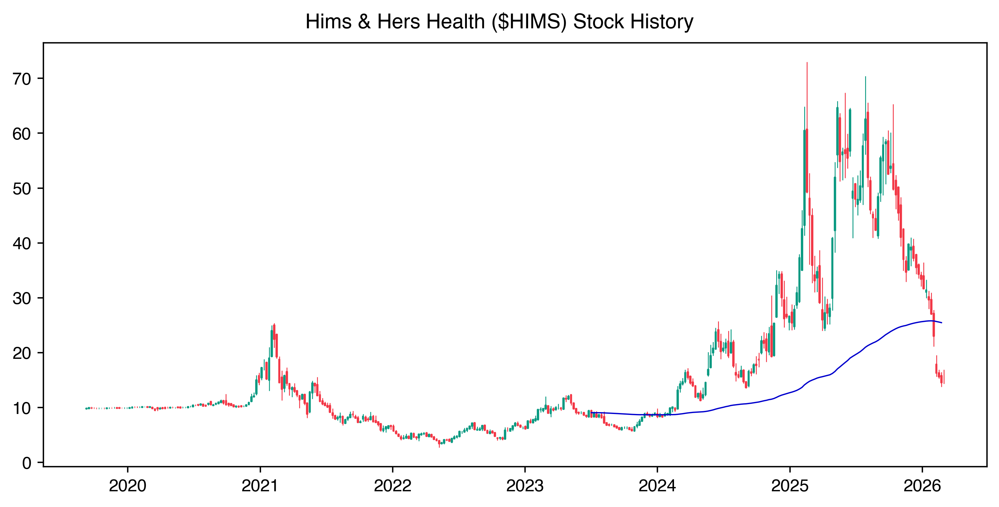

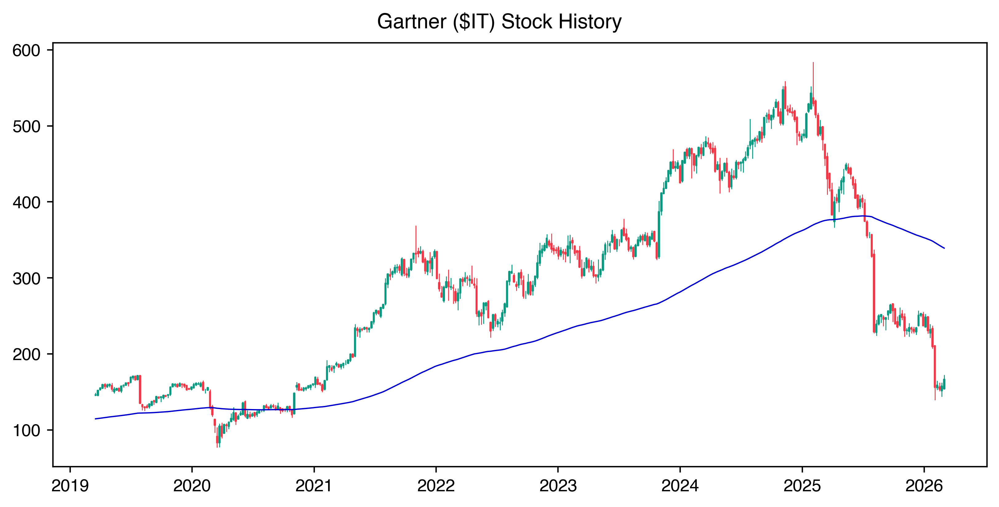

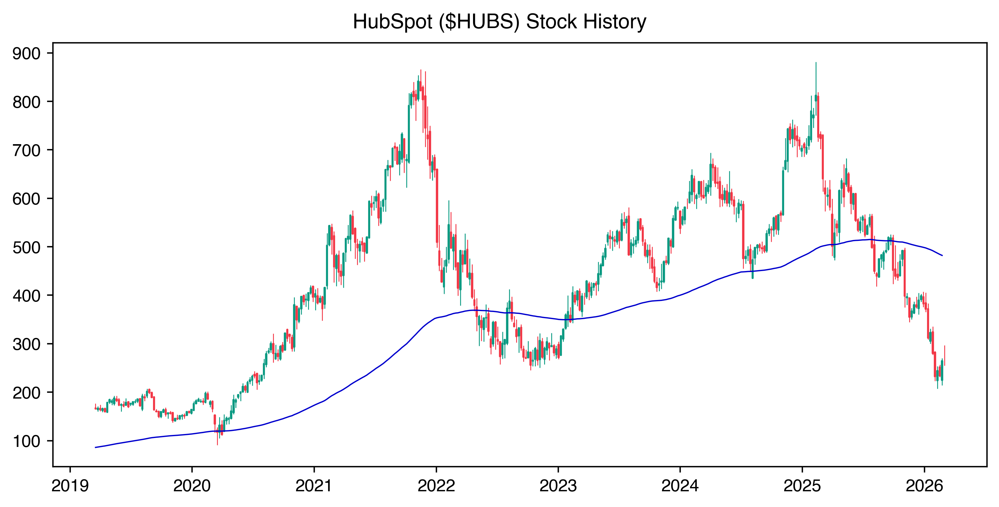

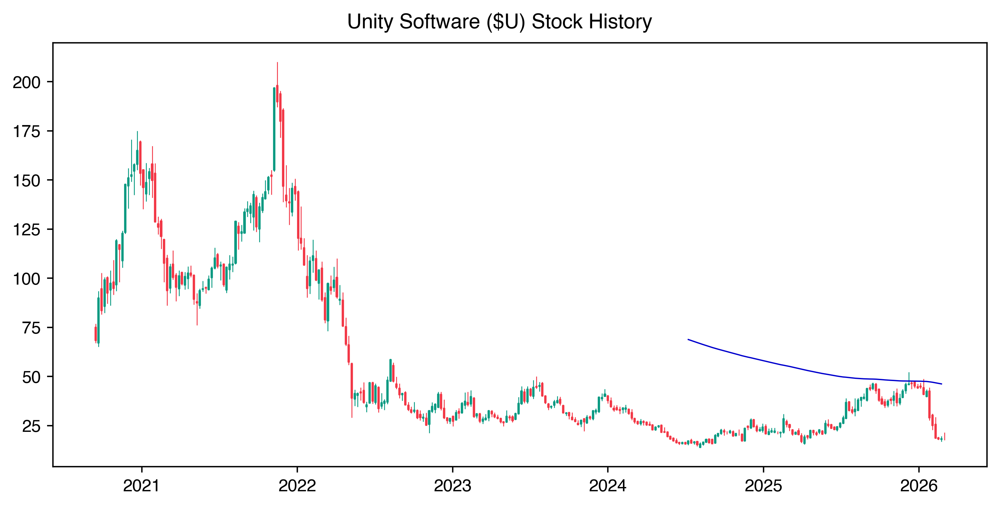

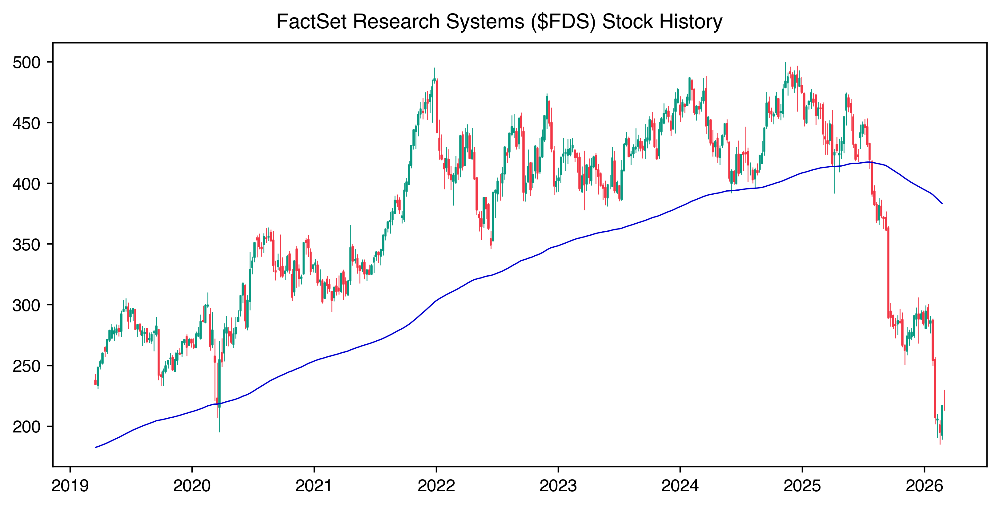

...

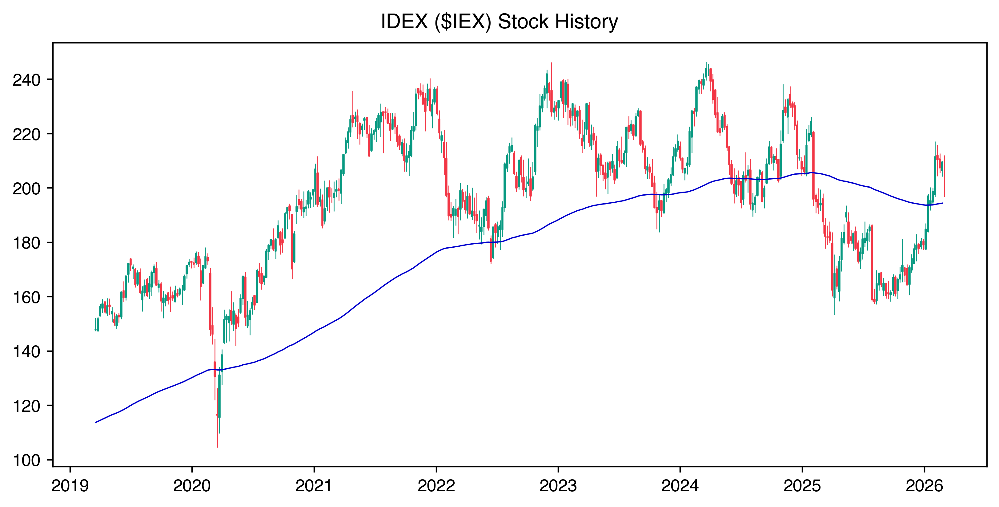

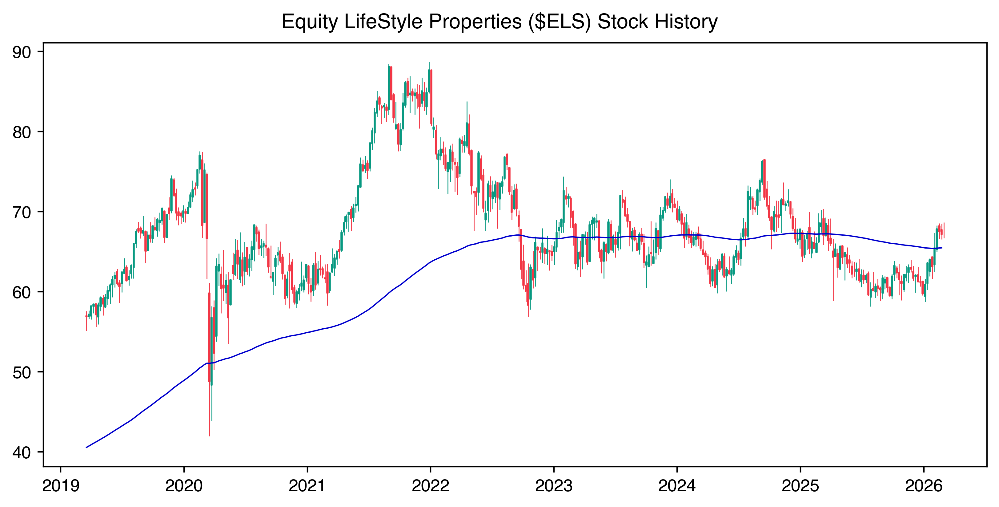

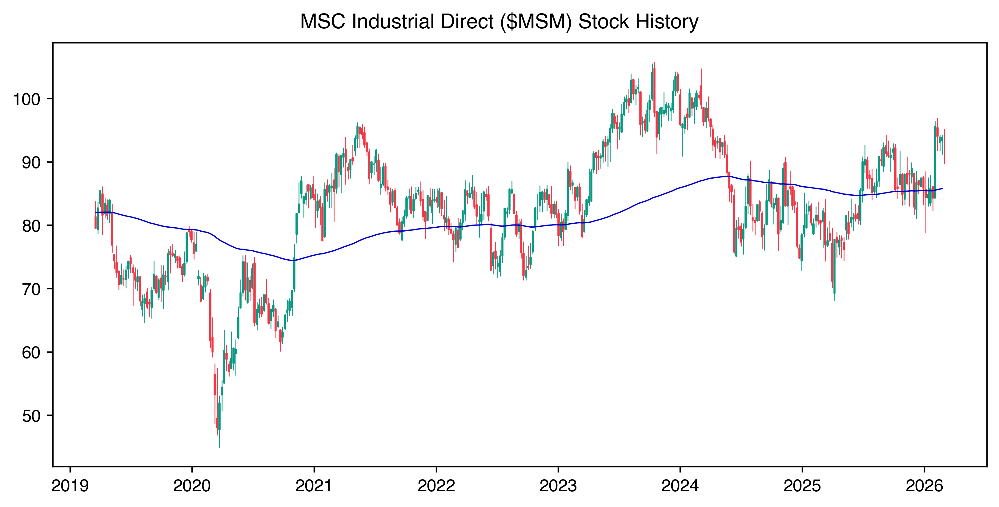

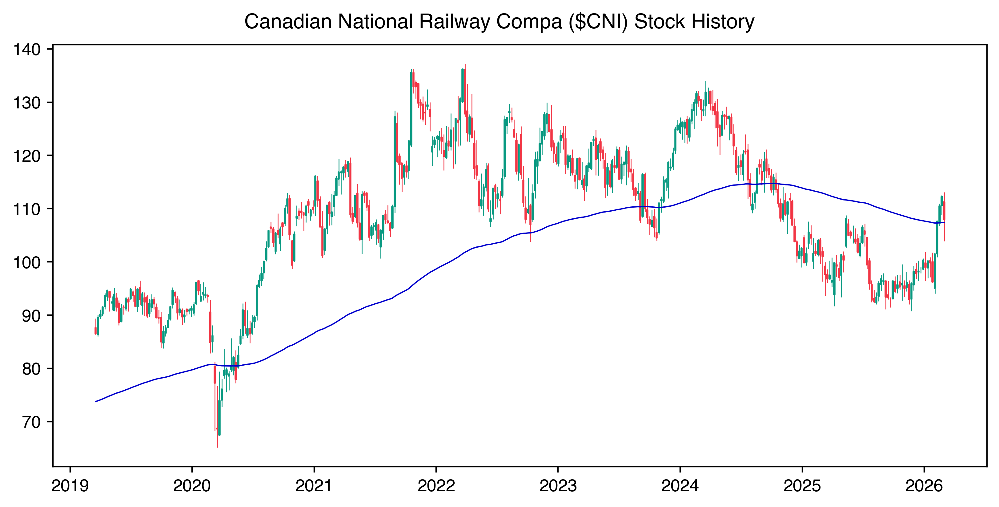

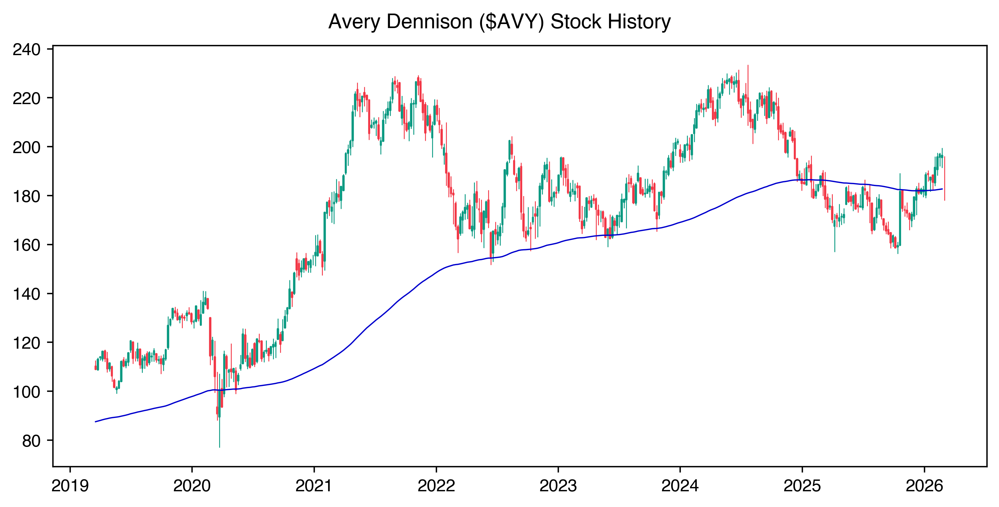

In [58]:
PlotScreenedStocks(screened_sharia_comp, stocks_trading_data)

(<Figure size 3200x1600 with 1 Axes>, <Axes: >)

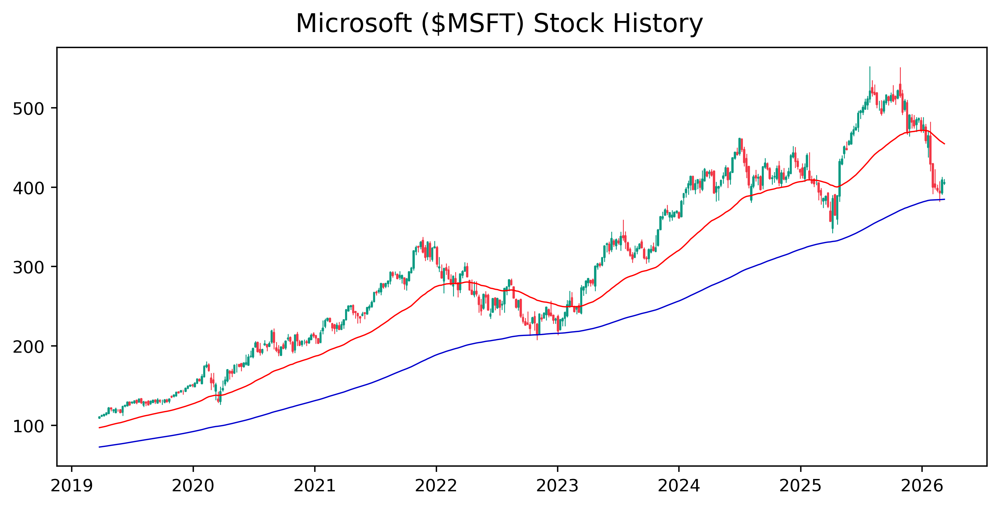

In [3]:
PlotStockHistory("MSFT", plotConfig=PlotConfig(
    indicators=[
        IndicatorSpec(PlotIndicator.EMA, EMAConfig(
            period=200, col_name="200_EMA")
        ),
        IndicatorSpec(PlotIndicator.EMA, EMAConfig(
            period=50, col_name="50_EMA", color="red")
        )
    ]
))

/Users/Sean/Desktop/StockScanner/src/StockScreener/plotting.py:116: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  periods = index.to_period("Y")
/Users/Sean/Desktop/StockScanner/src/StockScreener/plotting.py:124: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  periods = index.to_period("M")


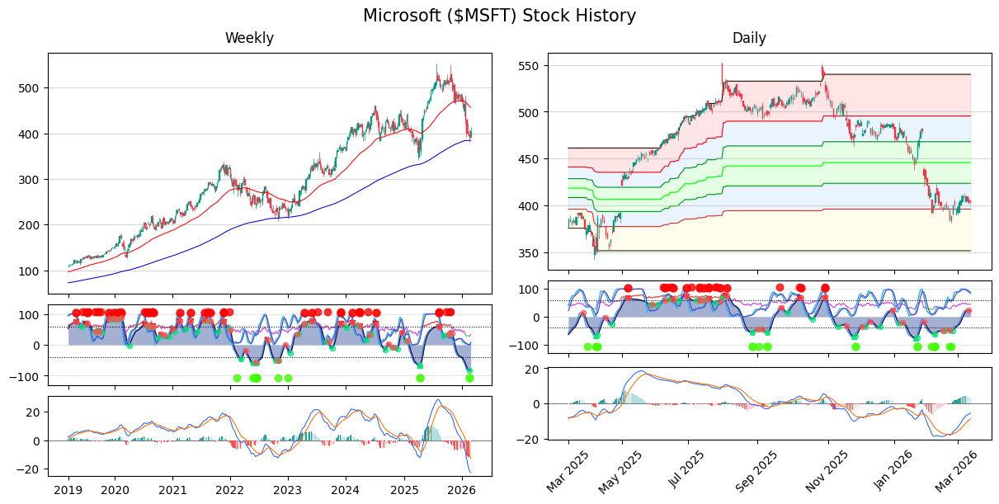

In [27]:
weekly_screen_config = PlotConfig(
    candles_to_display=364,
    axisTickMode=AxisTickMode.YEAR,
    axisDateFormat="%Y",
    indicators=[
        IndicatorSpec(PlotIndicator.EMA, EMAConfig(
            period=200, col_name="200_EMA")
        ),
        IndicatorSpec(PlotIndicator.EMA, EMAConfig(
            period=50, col_name="50_EMA", color="red")
        ),
        IndicatorSpec(PlotIndicator.VMC, VMCConfig()),
        IndicatorSpec(PlotIndicator.MACD, MACDConfig())
    ]
)

daily_detail_config = PlotConfig(
    candles_to_display=250,
    axisTickMode=AxisTickMode.MONTH,
    axisDateFormat="%b %Y",
    axisDateRotation=45,
    indicators=[
        IndicatorSpec(PlotIndicator.FIB, FibConfig()),
        IndicatorSpec(PlotIndicator.VMC, VMCConfig()),
        IndicatorSpec(PlotIndicator.MACD, MACDConfig())
    ]
)

fig = plt.figure(layout="constrained", figsize=(12, 6))
subfigures = fig.subfigures(1, 2)
fig.suptitle("Microsoft ($MSFT) Stock History", fontsize=15)

axes1 = subfigures[0].subplots(3, 1, sharex=True, height_ratios=[3, 1, 1])
axes2 = subfigures[1].subplots(3, 1, sharex=True, height_ratios=[3, 1, 1])

PlotStockHistory("MSFT", plotConfig=weekly_screen_config,
                 stockHistoryConfig=StockHistoryConfig(interval="1wk", period="max"), figAx=(subfigures[0], axes1),
                 figTitle="Weekly")

PlotStockHistory("MSFT", plotConfig=daily_detail_config,
                 stockHistoryConfig=StockHistoryConfig(interval="1d", period="max"), figAx=(subfigures[1], axes2),
                 figTitle="Daily")

plt.savefig("../Example.png", dpi=400, bbox_inches="tight")

In [34]:
history = [
    (10, 10),
    (7, 15),
    (-15, 20),
    (7, 15),
    (-8, 25)
]

sharesPurchased = sum(x[0] for x in history if x[0] > 0)
sharesSold = -1 * sum(x[0] for x in history if x[0] < 0)

costBasis = 0

i = 0
while sharesSold > 0:
    if history[i][0] < 0:
        i+=1
        continue

    if sharesSold >= history[i][0]:
        costBasis += history[i][0] * history[i][1]
        sharesSold -= history[i][0]
    else:
        costBasis += sharesSold * history[i][1]
        sharesSold -= sharesSold

    i+=1

saleProceeds = -1 * sum(x[0] * x[1] for x in history if x[0] < 0)

realizedPnL = saleProceeds - costBasis

print(costBasis, saleProceeds, realizedPnL)

295 500 205


In [29]:
portfolio = Portfolio()
portfolio.Buy("AAPL", "3-12", 10, 10, "")
portfolio.Buy("AAPL", "3-13", 7, 15, "")
portfolio.Sell("AAPL", "3-14", 15, 20, "")
portfolio.Buy("AAPL", "3-15", 7, 15, "")
portfolio.Sell("AAPL", "3-16", 8, 25, "")

portfolio.ComputePnL_Portfolio(closeData={"AAPL": 25})

{'AAPL': {'Realized PnL': 205,
  'Realized PnL (%)': 69.49152542372882,
  'Unrealized PnL': 10,
  'Unrealized PnL (%)': 66.66666666666666,
  'Position Cost Basis': 15}}

In [ ]:
from datetime import datetime
from StockScreener.Position import Position

p = Position("AAPL", 5, 5, "", datetime.fromordinal(1))
p.Buy(5, 7.5, "", datetime.fromordinal(2))
p.Sell(8, 10, "", datetime.fromordinal(3))


Decimal('80')

In [148]:
p = Portfolio()
p.Buy("AAPL", Decimal(10), Decimal(5), "", datetime.fromordinal(1))
p.Sell('AAPL', Decimal(7), Decimal(15), "", datetime.fromordinal(2))
p.Buy("MSFT", Decimal(1), Decimal(100), "", datetime.fromordinal(1))
p.Sell("MSFT", Decimal(0.5), Decimal(120), "", datetime.fromordinal(2))

p.GetPortfolioPnL({"AAPL": Decimal(14), "MSFT": Decimal(130)})
p.SummarizeHoldings({"AAPL": Decimal(14), "MSFT": Decimal(130)})

,ticker,openShares,averageEntry,costBasis,marketValue,realizedPnL,realizedPnL_percent,unrealizedPnL,unrealizedPnL_percent
0,AAPL,3,5,15,42,70,200,27,180
1,MSFT,0.5,100,50.0,65.0,10.0,20,15.0,30
